In [1]:
# importing libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
# defining file path

path  = r'C:\Users\Layzr\Desktop\School\Data Immersion Part 6\Achievement 6'

In [4]:
# importing dataset

df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'cleaned_dataset.csv'))

In [6]:
df.head()

,Unnamed: 0,year,player,age,team,lg,war,g,pa,ab,...,rbat+,tb,gidp,hbp,sh,sf,ibb,pos,awards,player-additional
0,0,2023,Marcus Semien,32,TEX,AL,7.7,162,753,670,...,131,320,5,5,0,5,1,*4,ASMVP-3SS,semiema01
1,1,2023,Ronald Acuña Jr.,25,ATL,NL,8.4,159,735,643,...,175,383,15,9,0,3,3,*9/D,ASMVP-1SS,acunaro01
2,2,2024,Jarren Duran*,27,BOS,AL,8.7,160,735,671,...,134,330,6,6,1,3,1,*87,ASMVP-8,duranja01
3,3,2024,Shohei Ohtani*,29,LAD,NL,9.2,159,731,636,...,190,411,7,6,0,5,10,*D,ASMVP-1SS,ohtansh01
4,4,2023,Freddie Freeman*,33,LAD,NL,6.8,161,730,637,...,167,361,14,16,0,5,12,*3,ASMVP-3,freemfr01


In [8]:
# dropping unneeded column

df = df.drop('Unnamed: 0', axis=1)

In [9]:
df.head()

,year,player,age,team,lg,war,g,pa,ab,r,...,rbat+,tb,gidp,hbp,sh,sf,ibb,pos,awards,player-additional
0,2023,Marcus Semien,32,TEX,AL,7.7,162,753,670,122,...,131,320,5,5,0,5,1,*4,ASMVP-3SS,semiema01
1,2023,Ronald Acuña Jr.,25,ATL,NL,8.4,159,735,643,149,...,175,383,15,9,0,3,3,*9/D,ASMVP-1SS,acunaro01
2,2024,Jarren Duran*,27,BOS,AL,8.7,160,735,671,111,...,134,330,6,6,1,3,1,*87,ASMVP-8,duranja01
3,2024,Shohei Ohtani*,29,LAD,NL,9.2,159,731,636,134,...,190,411,7,6,0,5,10,*D,ASMVP-1SS,ohtansh01
4,2023,Freddie Freeman*,33,LAD,NL,6.8,161,730,637,131,...,167,361,14,16,0,5,12,*3,ASMVP-3,freemfr01


In [10]:
# checking data types

df.dtypes

year                   int64
player                object
age                    int64
team                  object
lg                    object
war                  float64
g                      int64
pa                     int64
ab                     int64
r                      int64
h                      int64
2b                     int64
3b                     int64
hr                     int64
rbi                    int64
sb                     int64
cs                     int64
bb                     int64
so                     int64
ba                   float64
obp                  float64
slg                  float64
ops                  float64
ops+                   int64
roba                 float64
rbat+                  int64
tb                     int64
gidp                   int64
hbp                    int64
sh                     int64
sf                     int64
ibb                    int64
pos                   object
awards                object
player-additio

In [46]:
# creating a new dataset with only numeric columns for correlation test

numeric_df = df.select_dtypes(include=['number'])

In [44]:
numeric_df['lg'] = df['lg']

In [12]:
print(numeric_df.dtypes)

year       int64
age        int64
war      float64
g          int64
pa         int64
ab         int64
r          int64
h          int64
2b         int64
3b         int64
hr         int64
rbi        int64
sb         int64
cs         int64
bb         int64
so         int64
ba       float64
obp      float64
slg      float64
ops      float64
ops+       int64
roba     float64
rbat+      int64
tb         int64
gidp       int64
hbp        int64
sh         int64
sf         int64
ibb        int64
dtype: object


In [18]:
# dropping columns I don't want in the correlation test

columns_to_drop = ['roba', 'rbat+', 'gidp', 'sh', 'sf', 'hbp']
numeric_df = numeric_df.drop(columns=columns_to_drop)

In [19]:
print(numeric_df.dtypes)

year      int64
age       int64
war     float64
g         int64
pa        int64
ab        int64
r         int64
h         int64
2b        int64
3b        int64
hr        int64
rbi       int64
sb        int64
cs        int64
bb        int64
so        int64
ba      float64
obp     float64
slg     float64
ops     float64
ops+      int64
tb        int64
ibb       int64
dtype: object


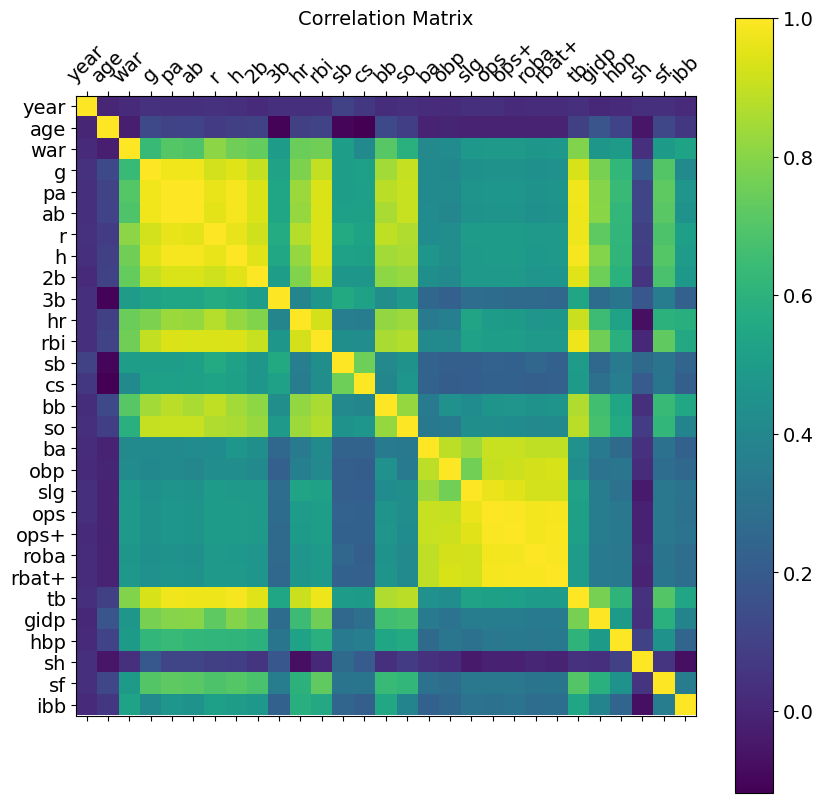

In [47]:
# creating a correlation matrix of most of the numeric columns

heatmap1 = plt.figure(figsize=(10, 10)) # figure size 
plt.matshow(numeric_df.corr(), fignum=heatmap1.number) # type of plot
plt.xticks(range(numeric_df.shape[1]), numeric_df.columns, fontsize=14, rotation=45) # x axis labels
plt.yticks(range(numeric_df.shape[1]), numeric_df.columns, fontsize=14) # y axis labels
cb = plt.colorbar() # add a colour legend (called colorbar)
cb.ax.tick_params(labelsize=14) # add font size
plt.title('Correlation Matrix', fontsize=14) # add title
plt.savefig('statistical_heatmap.png')

Obviously there is a lot here so I won't go into detail on everything but the main correlations I see are as follows
1. Games has a high positive correlation with most stats simply because the more games you play the more counting stats you will accumulate and the more games you play the more at bats and plate appearances you will have.
2. All the rate stats (ba, obp, slg, ops, and OPS+) have high positive correlations with eachother because the stats are kind of based off each other for example the higher your batting average the higher your on base percentage and slugging percentage which are then both combined to make OPS and OPS+ is based off OPS.
3. SB and CS (Stolen Bases and Caught Stealings) only very high positive correlations are each other simply because the more steals you attempt the more likely you are to get caught stealing.
4. Same with BB and SO(Walks and Strikeouts) because to take a walk you have to be willing to take pitches and sometimes you are going to take pitches in the zone resulting in strikeouts.
5. HRs and RBIs also have a 

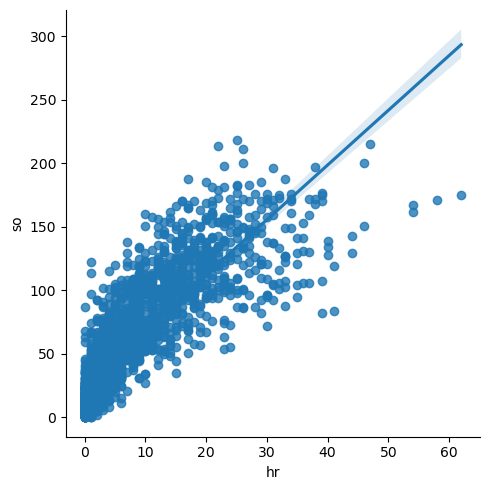

In [23]:
# creating a scatter plot of some the variables with high correlations

sns.lmplot(x = 'hr', y = 'so', data = df)

This shows a high positive correlation between strikeouts and home runs which can be explained partially by the fact that most players that hit a lot of home runs are more selective of what pitches they want to swing at because they are looking for the best pitches to hit as hard as they can causing them to strikeout more.

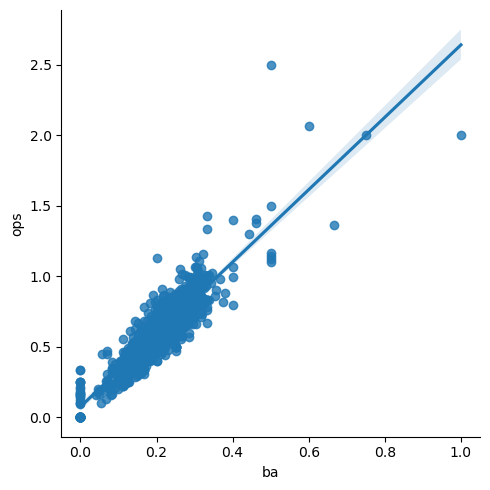

In [26]:
sns.lmplot(x = 'ba', y = 'ops', data = df)

This shows a high positive correlation between batting average and OPS with a few outliers because the higher your batting average the higher your OBP and SLG will be which is then used to create OPS. There are a few outliers however of people with very high OPS and middle of the road batting average these players are people who have high SLG by way of hitting a lot of home runs and doubles.

In [29]:
pair = sns.pairplot(df)

The main thing I notice is the rate stats with high positive correlations (ba, obp, slg, ops, ops+, roba, rbat+) all behave nearly identically to eachother with all the variables in the dataset.

Variables I'd like to explore further:
1. LG, I want to see if their is any correlation with some stats when playing in the american league vs the national league
2. WAR, I want to know what stats WAR (Wins Above Replacement) favors I could see in the heatmap that it has a high positive correlation with home runs because home runs are the most impactful kind of offense but it didn't have that high of a correlation with OPS which is an all encompassing offensive stat.

<Axes: xlabel='ops', ylabel='Count'>

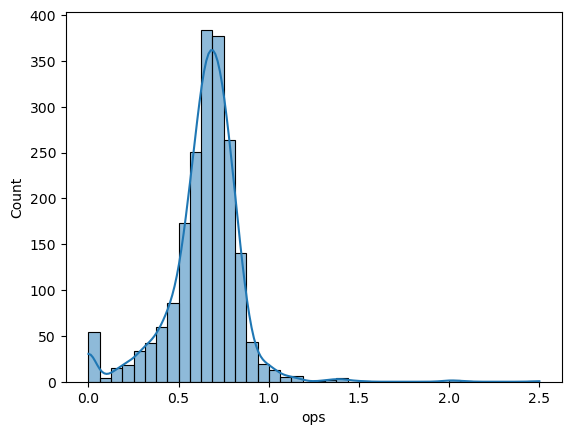

In [34]:
sns.histplot(df['ops'], bins = 40, kde = True)

In [50]:
# defining batter production categories

df.loc[df['ops'] < .7, 'batter production'] = 'Low production'

In [51]:
df.loc[(df['ops'] >= .7) & (df['ops'] < .8), 'batter production'] = 'Average production'

In [52]:
df.loc[df['ops'] >= .8, 'batter production'] = 'High production'

In [53]:
df.loc[df['ops'] >= .9, 'batter production'] = 'Elite production'

In [54]:
df['batter production'].value_counts(dropna = False)

batter production
Low production        1195
Average production     514
High production        215
Elite production        75
Name: count, dtype: int64

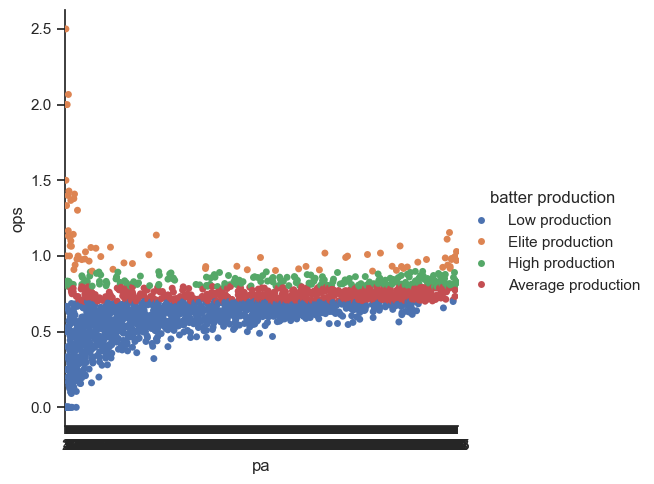

In [56]:
sns.set(style="ticks")
catplot = sns.catplot(x="pa", y="ops", hue="batter production", data=df)

In [57]:
catplot.savefig('production.png')

Very few players are able to hold elite production over a substantial amount of plate appearances.
There are a lot more low production players than I would have initially thought

## Answered Questions

I found that the correlation between Home Runs and Strikeouts is very high (about a 0.8)

Age and OPS/OPS+ have basically no correlation at all

## New Questions

I want to know what stats WAR (Wins Above Replacement) favors I could see in the heatmap that it has a high positive correlation with home runs because home runs are the most impactful kind of offense but it didn't have that high of a correlation with OPS which is an all encompassing offensive stat.

# Hypotheses

The more home runs you hit the more walks you will draw because pitchers will be more scared to throw you strikes